<a href="https://colab.research.google.com/github/Lagc93/Senales_Y_Sistemas/blob/main/transformadaZ_23_11_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

In [26]:
#@title FUNCIONES Y LIBRERÍAS

import soundfile as sf
import scipy
import numpy as np

from scipy.signal import butter
from scipy.signal import cheby1
from scipy.signal import cheby2
from scipy.signal import bessel
from scipy.signal import ellip
from scipy.signal import firwin
from scipy.signal import lfilter, filtfilt
from scipy.signal import freqz_zpk
from IPython.display import Markdown as md
from IPython.display import Audio
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [27]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz (2.6 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached mutagen-1.47.0-py3-none-any.whl (194 kB)
  Using cached pycryptodomex-3.19.0-cp35-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
  Using cached websockets-12.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (130 kB)
  Using cached certifi-2023.11.17-py3-none-any.whl (162 kB)
  Using cached requests-2.31.0-py3-none-any.whl (62 kB)
  Using cached urllib3-2.1.0-py3-none-any.whl (104 kB)
  Using cached Brotli-1.1.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (3.0 MB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (142 kB)
  Using cached idna-3.4-py3-none-

In [28]:
# Realizamos un programa para comenzar a descargar la canción dónde se leerá el link y el nombre de esta

import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [29]:
link_= ["https://www.youtube.com/watch?v=KwUV42OVDhI"]
name_ = ['Porque te amo - Nino Segarra'
        ]
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Porque te amo - Nino Segarra
[youtube] Extracting URL: https://www.youtube.com/watch?v=KwUV42OVDhI
[youtube] KwUV42OVDhI: Downloading webpage
[youtube] KwUV42OVDhI: Downloading ios player API JSON
[youtube] KwUV42OVDhI: Downloading android player API JSON
[youtube] KwUV42OVDhI: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=KwUV42OVDhI
[youtube] KwUV42OVDhI: Downloading webpage
[youtube] KwUV42OVDhI: Downloading ios player API JSON
[youtube] KwUV42OVDhI: Downloading android player API JSON
[youtube] KwUV42OVDhI: Downloading m3u8 information
[info] KwUV42OVDhI: Downloading 1 format(s): 251
[download] Porque te amo - Nino Segarra.mp3 has already been downloaded
[download] 100% of    5.37MiB
Download complete... Porque te amo - Nino Segarra.mp3


In [30]:
# Instalamos la extensión soundfile
!pip install soundfile

In [31]:
import subprocess

for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [32]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

print('Frecuencia de muestreo %.2f[Hz]' %(fs))
xpro = x.copy()

inicial =  40
final =  50

corte1= 2500
corte2= 6700

ti = inicial
tf = final
xs = xpro[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1
print(f'Audio original:')
Audio([xs[:,1], xs[:,0]],rate=fs) #segmento de audio

Frecuencia de muestreo 48000.00[Hz]
audio Porque te amo - Nino Segarra.wav
Frecuencia de muestreo 48000.00[Hz]
Audio original:


In [33]:
filtrado="bandpass"
N_orden=6



corte1= 3000
corte2= 7700

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = butter(N_orden, Wn=wn, btype=filtrado, output='ba',fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


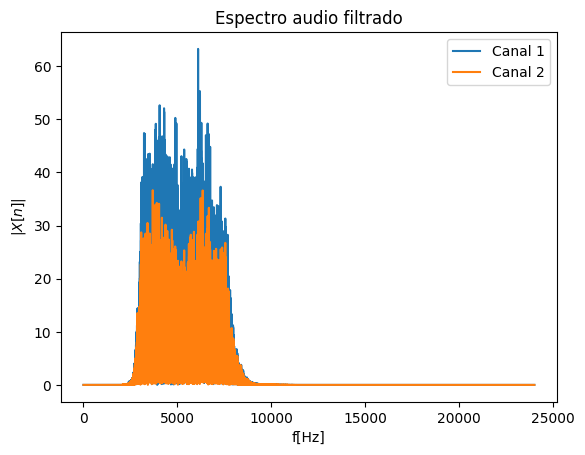

In [34]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0) # fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [35]:
filtrado="bandpass"
N_orden=2
ripple=7

corte1= 4500
corte2= 6700

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=cheby1(N_orden, rp=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


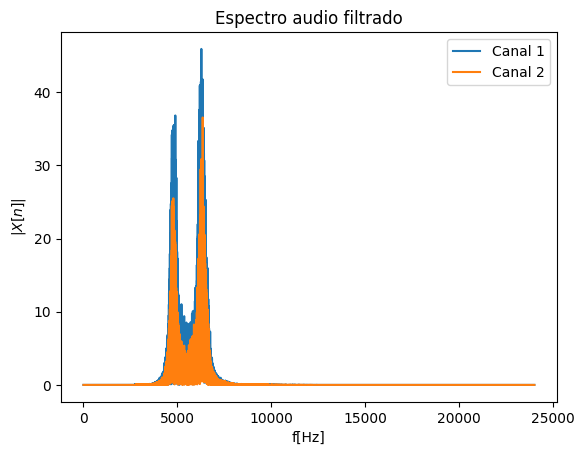

In [36]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [37]:
filtrado="bandpass"
N_orden=6
ripple=10

corte1= 5000
corte2= 6700

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = cheby2(N_orden, rs=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


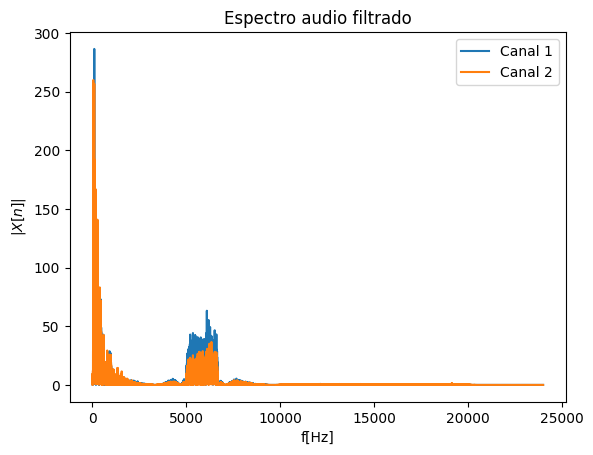

In [38]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [39]:
filtrado="bandpass"
N_orden=6
normali="mag"

corte1= 1500
corte2= 2500

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den = bessel(N_orden, wn, btype=filtrado, output='ba', norm = normali, fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado:')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado:


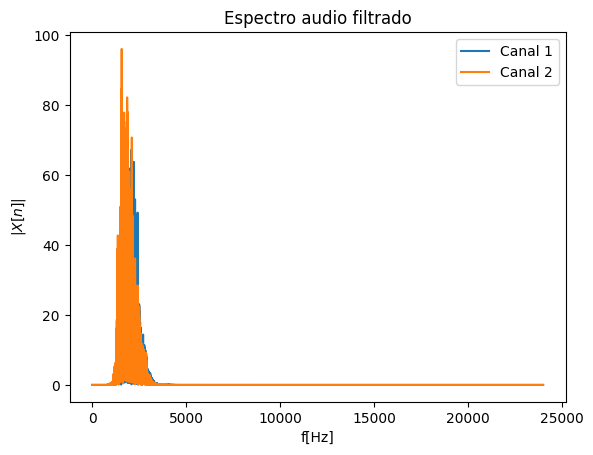

In [40]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [41]:
filtrado="bandpass"
N_orden=6
ripple_pass=3
ripple_stop=6

corte1= 2500
corte2= 6700

wn=[1000,8000]

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den=ellip(N_orden, rp=ripple_pass, rs=ripple_stop, Wn=wn, btype=filtrado, fs=fs)

xf=filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


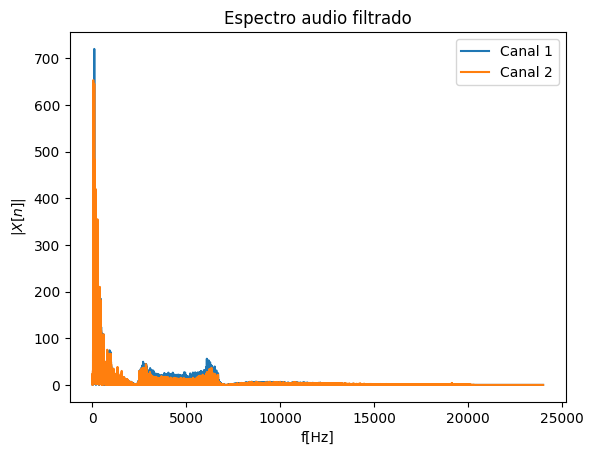

In [42]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

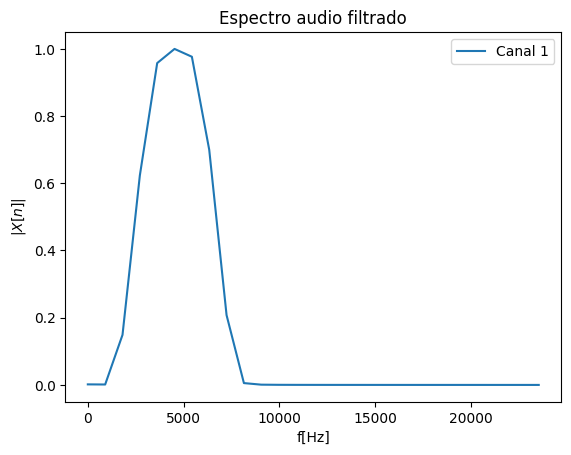

In [43]:
N_orden=53

coeff_fir=firwin(N_orden, [corte1, corte2], pass_zero=False, fs=fs)

xpro=coeff_fir.copy()
Xw=np.fft.rfft(coeff_fir,axis=0)
vf=np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()


2. Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función [firwin](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html) y [material de apoyo](https://www.programcreek.com/python/example/100540/scipy.signal.firwin)). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que $a_0=1$, y $a_k=0$ $\forall k\in\{1,2,\dots\}$.


El método de diseño de filtros FIR por ventaneo es una técnica utilizada para diseñar filtros de respuesta finita al impulso (FIR). Este método implica multiplicar la respuesta al impulso ideal (que generalmente se obtiene mediante otro método, como el método de la ventana) por una ventana, lo que tiene el efecto de truncar la respuesta al impulso infinita a una duración finita.

La función firwin se utiliza comúnmente en el lenguaje de programación Python con la biblioteca SciPy para diseñar filtros FIR mediante el método de ventaneo. Esta función toma como entrada los parámetros del filtro, como la frecuencia de corte, la longitud del filtro y el tipo de ventana, y devuelve los coeficientes del filtro FIR resultante.

Ventajas:
1.	Eficiencia en el orden: Los filtros IIR tienden a ser más eficientes en términos de orden en comparación con los filtros FIR para lograr especificaciones similares.
2.	Implementación en tiempo real: Pueden ser más adecuados para aplicaciones en tiempo real debido a su naturaleza recursiva y menor cantidad de coeficientes.
Desventajas:
1.	Posible inestabilidad: Los filtros IIR pueden volverse inestables, especialmente si se diseñan con coeficientes inapropiados, lo que puede conducir a problemas prácticos.
2.	Mayor susceptibilidad a la cuantización: La cuantización de los coeficientes en la implementación práctica puede introducir errores más significativos en los filtros IIR.
Filtros FIR:
Ventajas:
1.	Estabilidad: Los filtros FIR son inherentemente estables debido a su naturaleza de respuesta finita al impulso.
2.	Menor susceptibilidad a la cuantización: Suelen ser menos sensibles a errores de cuantización en la implementación práctica debido a su estructura.
Desventajas:
1.	Mayor orden para ciertas especificaciones: En general, pueden requerir un mayor orden para cumplir con ciertas especificaciones en comparación con los filtros IIR.
2.	Mayor latencia: La longitud de la respuesta al impulso finita puede introducir mayor latencia en comparación con los filtros IIR.


3. Incluya la implementación del filtro `firwin` en el punto 1.